In [3]:
import scanpy as sc
import matplotlib as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.pyplot import rc_context

In [4]:
sc.set_figure_params(dpi=300, color_map="viridis_r")
sc.settings.verbosity = 0
sc.logging.print_header()

/home/foxlab/xiaoke/.conda/envs/scpy/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-03-05 20:12:07.634937: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


scanpy==1.10.3 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.14.1 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.4 igraph==0.11.6 louvain==0.8.2 pynndescent==0.5.13


In [5]:
# Load the h5ad exported from seurat
adata = sc.read_h5ad("seurat_allgenes.h5ad")
adata

AnnData object with n_obs × n_vars = 42390 × 26494
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'treatment', 'replicate', 'bc', 'percent.mt', 'name', 'RNA_snn_res.0.2', 'seurat_clusters', 'Label', 'cell type', 'log2.mt', 'phenotype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'rank_genes_groups'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'

In [17]:
# Store normalized adata in to raw data
adata.raw = adata

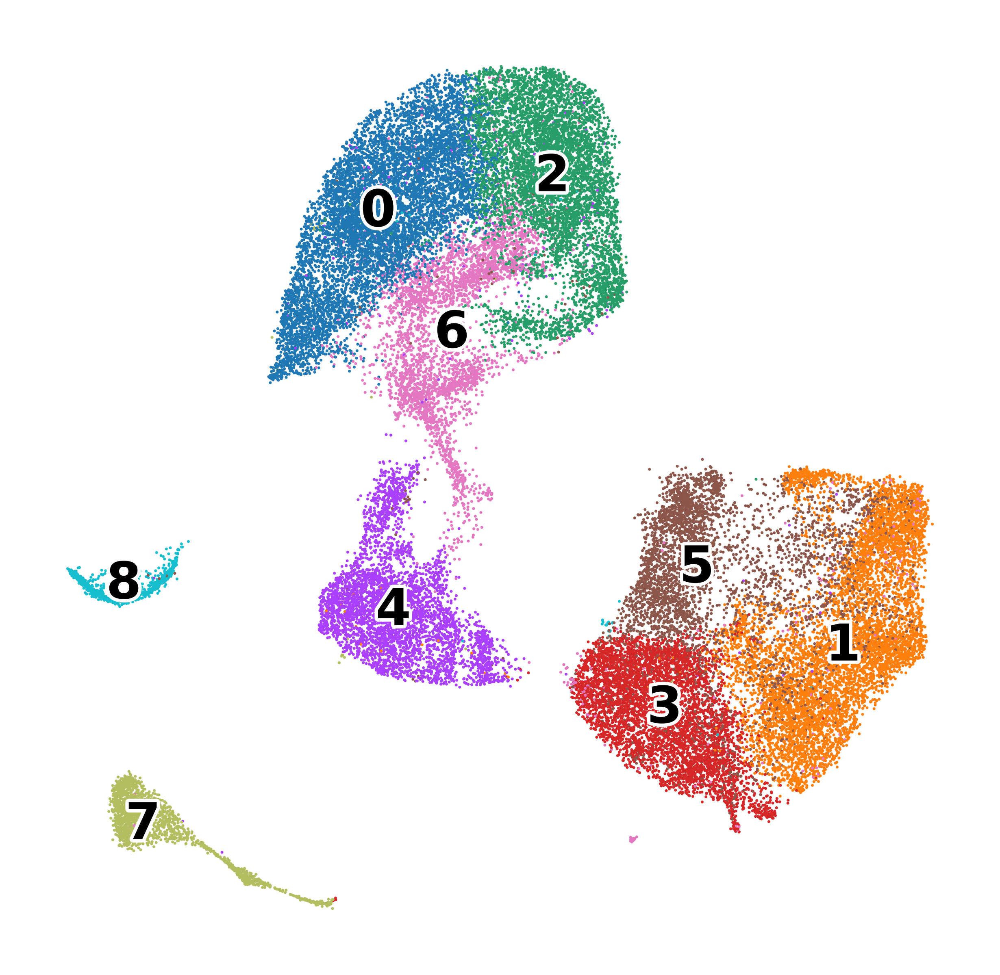

In [5]:
# Covert seurat_clusters to categorical
adata.obs["seurat_clusters"] = adata.obs["seurat_clusters"].astype("category")

# UMAP
with rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(adata, color = "seurat_clusters", legend_loc = "on data",
               frameon = False, legend_fontsize = 15, legend_fontoutline=2, title = "")

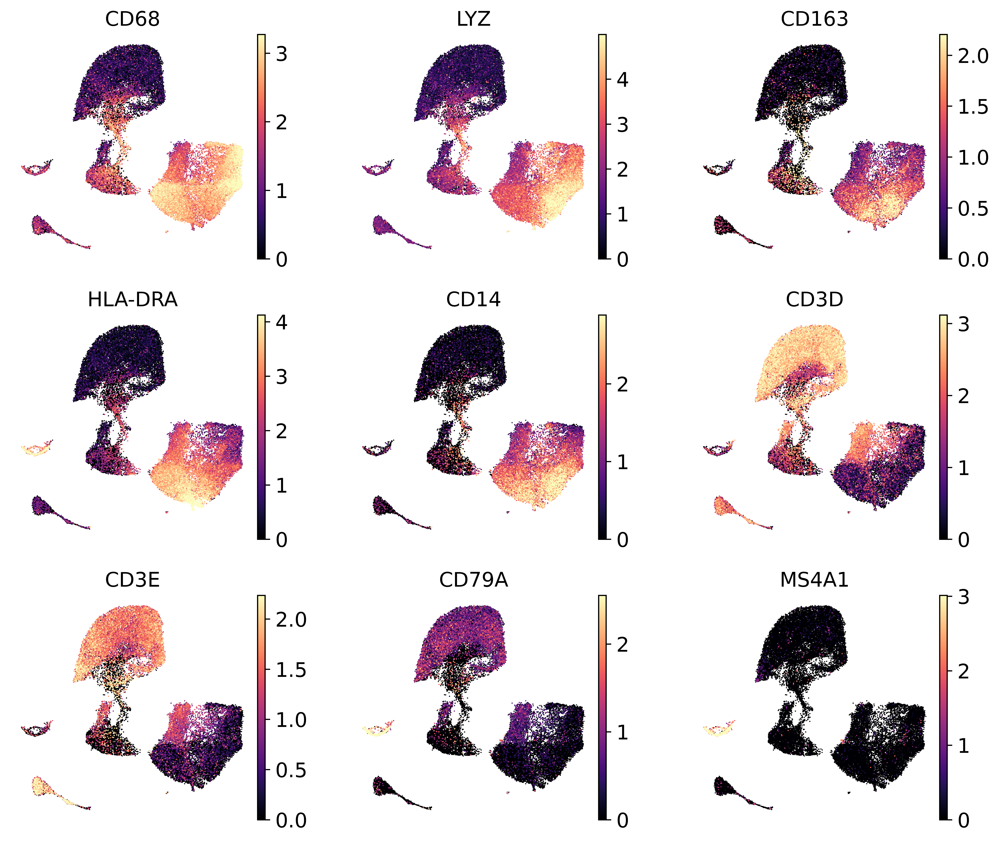

In [10]:
color_vars = ["CD68","LYZ","CD163",
              "HLA-DRA","CD14","CD3D",
              "CD3E","CD79A","MS4A1"]
with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(adata, color=color_vars, frameon=False, ncols=3, cmap = "magma",vmax = "p99",
              use_raw = True)

In [1]:
# marker gene dictionary
marker_genes_dict = {
    "Naive_T": ["LEF1","TCF7"],
    "SPP1_Mac": ["LYZ","SPP1"],
    "Proli_T": ["TOP2A","MKI67"],
    "HLAII_Mac":["CD74","HLA-DRA"],
    "Mac":["TPRG1","DOCK3"],
    "Mac_T": ["CCL2","CCL3"],
    "MT": ["log2.mt"],
    "Activited_T": ["CCL5","IL32","RORA"],
    "B": ["CD79A","MS4A1"],
}

In [12]:
# Add annotation
cluster2anno = {
    0: "Naive_T",
    1: "SPP1_Mac",
    2: "Proli_T",
    3: "HLAII_Mac",
    4: "Mac",
    5: "Mac_T",
    6: "MT",
    7: "Activited_T",
    8: "B"}
adata.obs["cell type"] = adata.obs["seurat_clusters"].map(cluster2anno).astype("category")

In [13]:
adata.obs["log2.mt"] = np.log2(adata.obs["percent.mt"] + 1)

In [5]:
# Save the updated H5
adata.write("seurat_allgenes.h5ad")

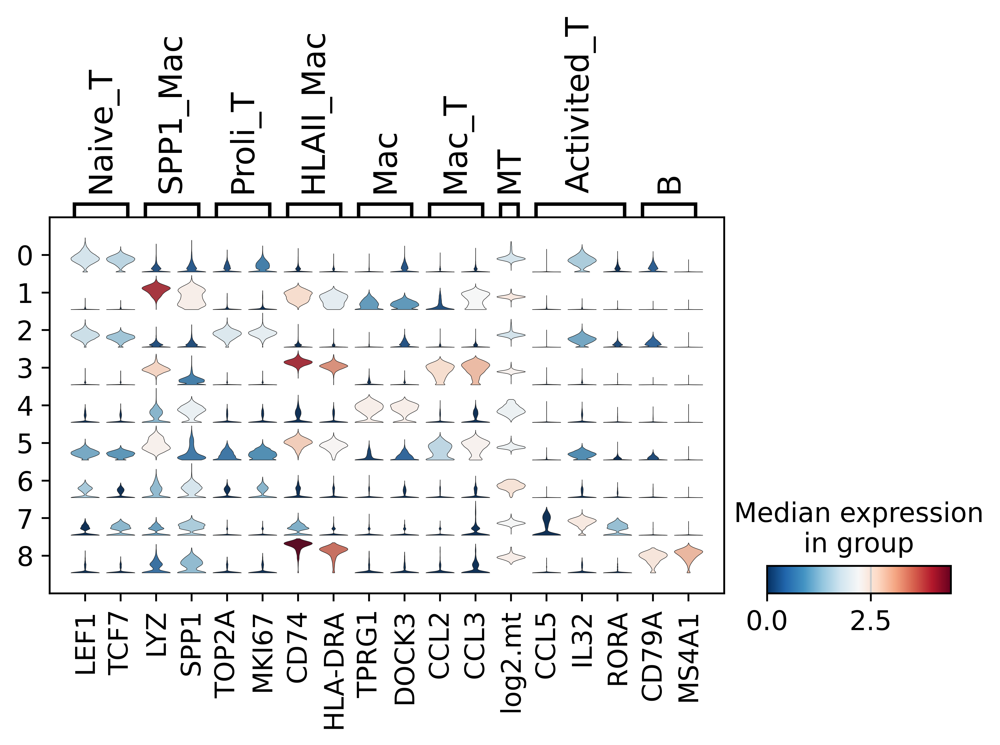

In [10]:
# DotPlot for detailed characterization
sc.pl.stacked_violin(adata, marker_genes_dict, groupby = "seurat_clusters",
                         swap_axes = False, figsize = (7,3), cmap = "RdBu_r", use_raw = True)

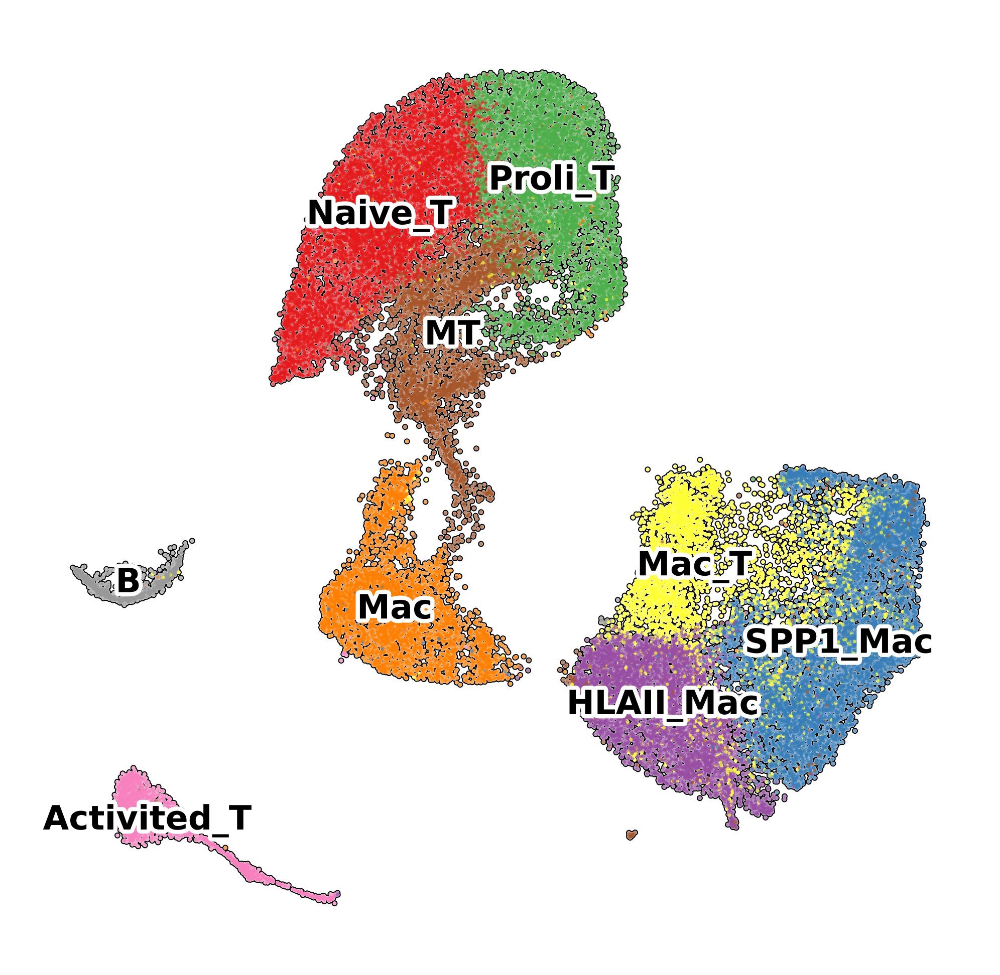

In [11]:
# Plot the UMAP with annotations:
sc.pl.umap(
        adata,
        color="cell type",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=8,
        legend_fontoutline=2,
        frameon=False,
        title="",
        palette="Set1",
    )

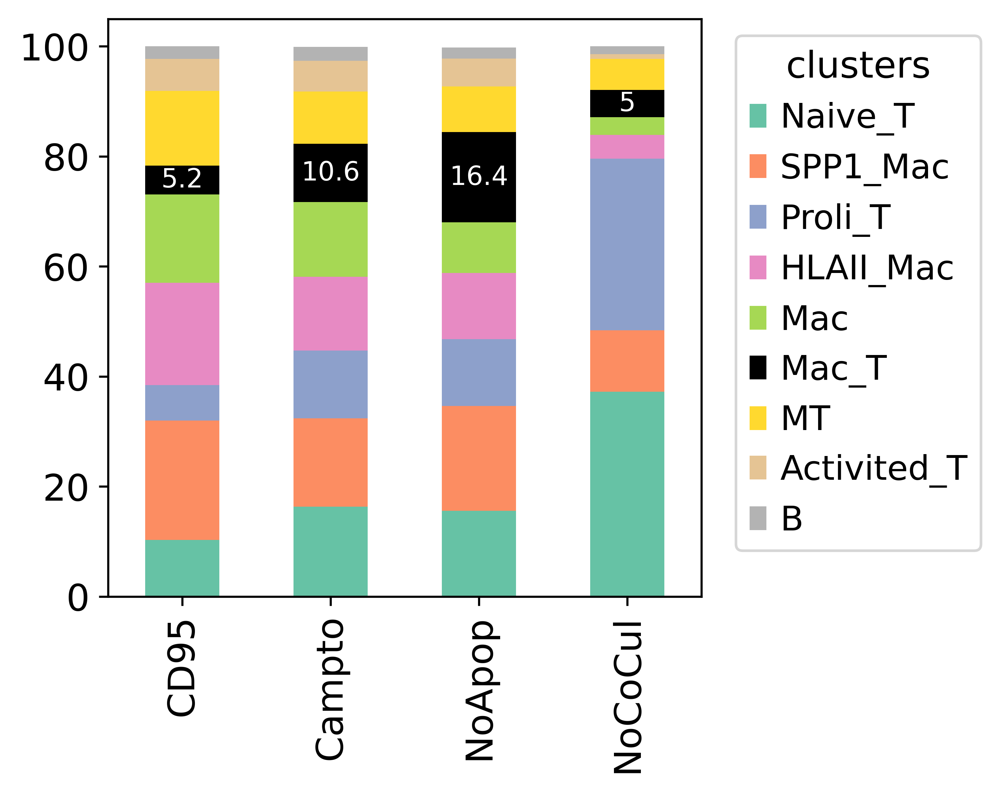

In [12]:
# Mac_T percentage in each treatment group
# Extract data
df = pd.DataFrame(adata.obs)
df2 = round(pd.crosstab(df["cell type"], df["treatment"], normalize = "columns")*100,1)
unique_cell_types = [cell for cell in df2.index if cell != "Mac_T"]
palette = sns.color_palette("Set2", len(unique_cell_types))
colors = {cell_type: "#000000" if cell_type == "Mac_T" else palette[i] 
          for i, cell_type in enumerate(unique_cell_types)}
color_list = [colors.get(cell_type, "#000000") for cell_type in df2.index]
# Plot
ax =df2.T.plot(kind = "bar", stacked = True, color = color_list)
ax.legend(title='clusters', bbox_to_anchor=(1.5, 1),loc='upper right')
ax.set_xlabel(None)
ax.grid(False)
for i, cell_type in enumerate(df2.index):
    if cell_type == "Mac_T":
        ax.bar_label(ax.containers[i], label_type = "center", color = 'w', fontsize = 10)

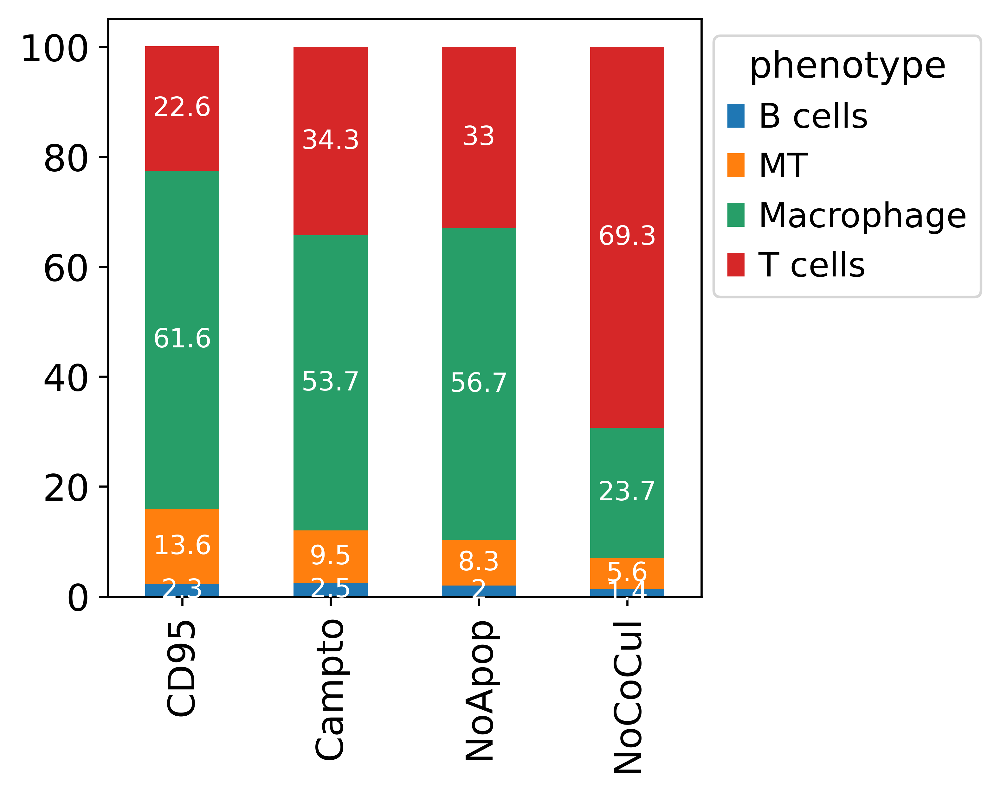

In [4]:
# Percentage of cell phenotype
# Add phenotype info in the adata metadata
# Add annotation
cluster2anno = {
    0: "T cells",
    1: "Macrophage",
    2: "T cells",
    3: "Macrophage",
    4: "Macrophage",
    5: "Macrophage",
    6: "MT",
    7: "T cells",
    8: "B cells"}
adata.obs["phenotype"] = adata.obs["seurat_clusters"].map(cluster2anno).astype("category")

# Extract data
df = pd.DataFrame(adata.obs)
df2 = round(pd.crosstab(df["phenotype"], df["treatment"], normalize = "columns")*100,1)
# Plot
ax =df2.T.plot(kind = "bar", stacked = True)
ax.legend(title='phenotype', bbox_to_anchor=(1.5, 1),loc='upper right')
ax.set_xlabel(None)
ax.grid(False)
for i, cell_type in enumerate(df2.index):
    ax.bar_label(ax.containers[i], label_type = "center", color = 'w', fontsize = 10)